## COE Analysis and Prediction

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn import model_selection
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error
from datetime import timedelta
from pandas.plotting import autocorrelation_plot
from statsmodels.tsa.stattools import acf
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.stattools import pacf
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.stattools import adfuller


%matplotlib inline

Original_COE = pd.read_excel('./Results of COE Bidding Exercise.xlsx')
Augment = pd.read_csv('./Merged Augment Data.csv')


## Data Sources

<u>COE data</u> 

Source: https://docs.google.com/spreadsheets/d/1Ma8dm_rdtdfNp8ONUG5ykFHwrEg1GFC3ObOMualMVBM/edit#gid=0

The COE dataset consists of results from COE bidding exercises from April 2002 to Nov 2022.  The result of every bidding exercise for each COE category is expressed as a single row.

It has the following original eight columns:

1) <b> Bidding_Exercise </b> - Month/Year of exercise and whether it is the first or second exercise of the month

2) <b> Announcement_Date </b> - End date of bidding exercise

3) <b> Year </b> - Year of exercise

4) <b> Category </b> - COE category.  There are five different categories:

            1) Cat A (Cars up to 1600cc and 97kW)
            2) Cat B (Cars above 1600cc or 97kW)
            3) Cat C (Goods vehicles and buses)
            4) Cat D (Motorcycles)
            5) Cat E (Open)

5) <b> Quota </b> - The number of COEs avaliable for bidding

6) <b> Quota_Premium </b> - The final COE price

7) <b> Total_Bids_Received </b> - Self-explanatory

8) <b> Number_Successful Bids </b> - Self-explanatory

<br>
<br>
The following four columns were added to it:

1) <b> Quota_Bid_Difference </b> - Quota minus Successful Bids.  A negative number means demand outsripped supply.  A positive number meant supply was higher than demand.

2) <b> Ratio_Successful_Total </b> - Successful Bids divide by Total Bids Received.  Ranges from 0 to 1.  The bigger the number the smaller the difference between Successful Bids and Total Bids Received.

3) <b> Ratio_Successful_Quota </b> - Successful Bids divide by Quota.  Ranges from 0 to 1.  The bigger the number the smaller the difference between Successful Bids and Quota.

4) <b> Bidding_Exercise_Type </b> - 1 if first bidding exercise of the month; 2 if second bidding exercise of the month

<br>
<br>
<u>Augment data</u> 

Five columns (with the sources indicated below): 

1) <b> Year of data </b>

2) <b> GDP per capita (current $S) from 2002 to 2021 </b>(https://databank.worldbank.org/reports.aspx?source=2&country=SGP#)

3) <b> GDP per capita growth (annual %) from from 2002 to 2021 </b>(https://databank.worldbank.org/reports.aspx?source=2&country=SGP#)

4) <b> Median Household income from work per household member from 2002 to 2021 </b>(https://www.singstat.gov.sg/find-data/search-by-theme/households/household-income/visualising-data/key-household-income-trends)

5) <b> Median Household income from work per household member growth (annual %) from 2002 to 2021 </b> (https://www.singstat.gov.sg/find-data/search-by-theme/households/household-income/visualising-data/key-household-income-trends)

The augment dataset only consists of data from 2002 to 2021 while the COE dataset consists of data from 2002 to 2022.  For consistency in the analysis, the 2022 data from the COE dataset will be filtered out for the training model.


## Objective

The first objective is to determine the relationship, if any, between the price of COEs and the following variables:

1) <b> Quota </b> - If there is high supply of COEs, the price of COEs should be lower ceteris paribus. 

2) <b> Total Bids Received </b> - If there is high demand for COEs, the price of COEs should be lower ceteris paribus.

3) <b> Quota Bid Difference </b> - If demand outstrips supply (i.e. shortage of COEs), the price of COEs will be higher.  Conversely, if the supply is higher than demand, the price of COEs will be lower.

4) <b> Ratio of Successful Bids to Total Bids </b> - The bigger the ratio the lower the price of COEs ceteris paribus because the gap between supply and demand is not so high.

5) <b> Ratio of Successful Bids to Quota </b> - What effect will there be on the price of COEs if there are less successful bids compared to the quota?  (<u>Note:</u> Unsuccessful bids might occur when there are multiple unsuccessful bids of the same price.  For instance, if the 3rd to 7th bids are of the same value and are competing for just three COEs, all five will be unsuccessful and the remaining three COEs will be carried over to the next exercise.)

6) <b> Bidding Exercise Type </b> - Is there a relationship between price of COEs and whether its the first or second exercise of the month?

7) <b> GDP per capita </b> - Used as a proxy for approximate individual wealth.  The higher the GDP per capita, the richer the individual and hence the higher the demand for cars, ceteris paribus.

8) <b> GDP per capita % annual change </b> - Used as a proxy for economic sentiment.  The higher the percentage change suggests that will be more optimistic of their economic future and thus more willing to commit to bigger purchases such as cars.  Conversely, the lower (or negative) percentage change would probably signify that people are pessimistic about their future and hence would unlikely want to buy cars.

9) <b> Median Household Income per Household Member </b> - Used as another proxy for approximate individual wealth.  The higher the median household income per household member, the more disposable income and hence the higher the demand for cars, ceteris paribus.

10) <b> Median Household Income per Household Member % annual change </b> - Used as a proxy for economic sentiment.  The higher the percentage change suggests that will be more optimistic of their economic future and thus more willing to commit to bigger purchases such as cars.  Conversely, the lower (or negative) percentage change would probably signify that people are pessimistic about their future and hence would unlikely want to buy cars.

11) <b> Previous Quota Premium </b>

12) <b> Difference in Quota Premium from previous exercise </b>




The second objective is to use linear regression and SARIMAX to predict the COE price using the above-mentioned variables.

## Data Transformation and Exploratory Data Analysis

In [2]:
#check for null values, shape, columns, type
Original_COE.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2445 entries, 0 to 2444
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   Bidding_Exercise        2445 non-null   object        
 1   Announcement_Date       2445 non-null   datetime64[ns]
 2   Year                    2445 non-null   int64         
 3   Category                2445 non-null   object        
 4   Quota                   2445 non-null   int64         
 5   Quota_Premium           2445 non-null   int64         
 6   Total_Bids_Received     2445 non-null   int64         
 7   Number_Successful_Bids  2445 non-null   int64         
 8   Quota_Bid_Difference    2445 non-null   int64         
 9   Ratio_Successful_Total  2445 non-null   float64       
 10  Ratio_Successful_Quota  2445 non-null   float64       
 11  Bidding_Exercise_Type   2445 non-null   int64         
dtypes: datetime64[ns](1), float64(2), int64(7), obje

In [3]:
#check for null values, shape, columns, type
Augment.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20 entries, 0 to 19
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Year            20 non-null     int64  
 1   GDP             20 non-null     float64
 2   GDP%            20 non-null     float64
 3   Median_Income   20 non-null     int64  
 4   Median_Income%  20 non-null     float64
dtypes: float64(3), int64(2)
memory usage: 928.0 bytes


In [4]:
#convert category to numerical value

Original_COE['Category_Encoding'] = Original_COE.Category.astype("category").cat.codes
Original_COE['Category_Encoding'] = Original_COE['Category_Encoding'] + 1
Original_COE.sort_values(by='Announcement_Date', ascending=True, inplace=True)
Original_COE.set_index('Announcement_Date', inplace=True)


In [5]:
#spilt table by category for following shift procedure

Original_COE_CatA = Original_COE.loc[Original_COE.Category_Encoding == 1].copy()
Original_COE_CatB = Original_COE.loc[Original_COE.Category_Encoding == 2].copy()
Original_COE_CatC = Original_COE.loc[Original_COE.Category_Encoding == 3].copy()
Original_COE_CatD = Original_COE.loc[Original_COE.Category_Encoding == 4].copy()
Original_COE_CatE = Original_COE.loc[Original_COE.Category_Encoding == 5].copy()


In [6]:
#create "Previous Quota Premium" and "Difference in Quota Premium from previous exercise" columns
#in 2002-2020 dataset
#drop NA rows due to shift

#cat A
Original_COE_CatA.loc[:,'Prev_Quota_Premium'] = Original_COE_CatA['Quota_Premium'].shift(1)
Original_COE_CatA['Premium_Change'] = Original_COE_CatA['Quota_Premium'] - Original_COE_CatA['Prev_Quota_Premium']
Original_COE_CatA = Original_COE_CatA.dropna()

#cat B
Original_COE_CatB.loc[:,'Prev_Quota_Premium'] = Original_COE_CatB['Quota_Premium'].shift(1)
Original_COE_CatB['Premium_Change'] = Original_COE_CatB['Quota_Premium'] - Original_COE_CatB['Prev_Quota_Premium']
Original_COE_CatB = Original_COE_CatB.dropna()

#cat C
Original_COE_CatC.loc[:,'Prev_Quota_Premium'] = Original_COE_CatC['Quota_Premium'].shift(1)
Original_COE_CatC['Premium_Change'] = Original_COE_CatC['Quota_Premium'] - Original_COE_CatC['Prev_Quota_Premium']
Original_COE_CatC = Original_COE_CatC.dropna()

#cat D
Original_COE_CatD.loc[:,'Prev_Quota_Premium'] = Original_COE_CatD['Quota_Premium'].shift(1)
Original_COE_CatD['Premium_Change'] = Original_COE_CatD['Quota_Premium'] - Original_COE_CatD['Prev_Quota_Premium']
Original_COE_CatD = Original_COE_CatD.dropna()

#cat E
Original_COE_CatE.loc[:,'Prev_Quota_Premium'] = Original_COE_CatE['Quota_Premium'].shift(1)
Original_COE_CatE['Premium_Change'] = Original_COE_CatE['Quota_Premium'] - Original_COE_CatE['Prev_Quota_Premium']
Original_COE_CatE = Original_COE_CatE.dropna()


In [7]:
#Reconstitute original table with new 'Prev_Quota_Premium' and 'Premium_Change' columns

Recombined_Table_COE = pd.concat([Original_COE_CatA,
                             Original_COE_CatB,
                             Original_COE_CatC,
                             Original_COE_CatD,
                             Original_COE_CatE])


In [8]:
#check for null values, shape, columns, type
Recombined_Table_COE.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2440 entries, 2002-04-15 to 2022-11-09
Data columns (total 14 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Bidding_Exercise        2440 non-null   object 
 1   Year                    2440 non-null   int64  
 2   Category                2440 non-null   object 
 3   Quota                   2440 non-null   int64  
 4   Quota_Premium           2440 non-null   int64  
 5   Total_Bids_Received     2440 non-null   int64  
 6   Number_Successful_Bids  2440 non-null   int64  
 7   Quota_Bid_Difference    2440 non-null   int64  
 8   Ratio_Successful_Total  2440 non-null   float64
 9   Ratio_Successful_Quota  2440 non-null   float64
 10  Bidding_Exercise_Type   2440 non-null   int64  
 11  Category_Encoding       2440 non-null   int8   
 12  Prev_Quota_Premium      2440 non-null   float64
 13  Premium_Change          2440 non-null   float64
dtypes: float64(4), int64(7

In [9]:
#merge original coe dataset with augment data
#merging will remove the 2022 COE data as there is no corresponding augment data
Augmented_Table = Recombined_Table_COE.reset_index().merge(Augment, on = 'Year').set_index('Announcement_Date')


In [10]:
#check for null values, shape, columns, type
Augmented_Table.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2335 entries, 2002-04-15 to 2021-12-22
Data columns (total 18 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Bidding_Exercise        2335 non-null   object 
 1   Year                    2335 non-null   int64  
 2   Category                2335 non-null   object 
 3   Quota                   2335 non-null   int64  
 4   Quota_Premium           2335 non-null   int64  
 5   Total_Bids_Received     2335 non-null   int64  
 6   Number_Successful_Bids  2335 non-null   int64  
 7   Quota_Bid_Difference    2335 non-null   int64  
 8   Ratio_Successful_Total  2335 non-null   float64
 9   Ratio_Successful_Quota  2335 non-null   float64
 10  Bidding_Exercise_Type   2335 non-null   int64  
 11  Category_Encoding       2335 non-null   int8   
 12  Prev_Quota_Premium      2335 non-null   float64
 13  Premium_Change          2335 non-null   float64
 14  GDP                   

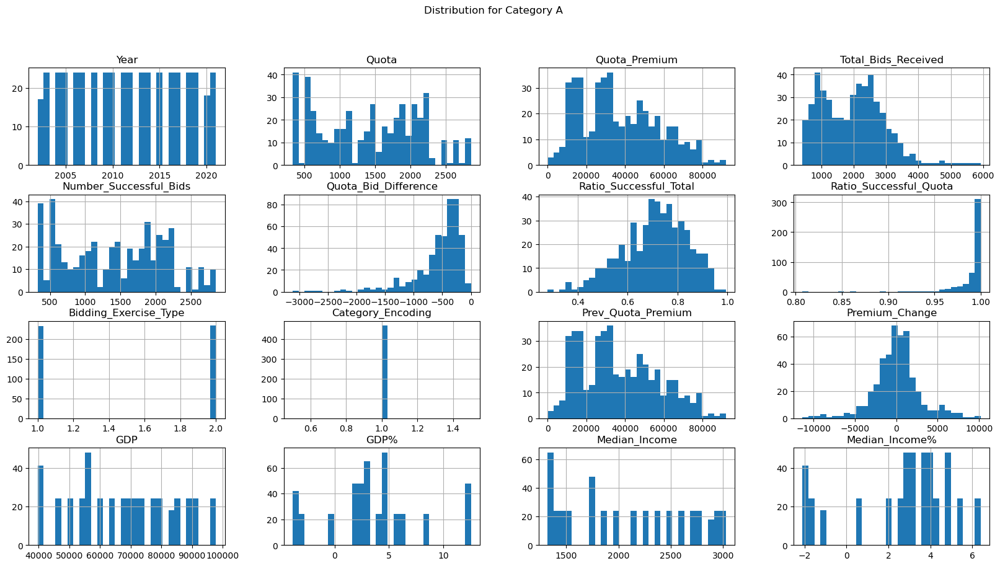

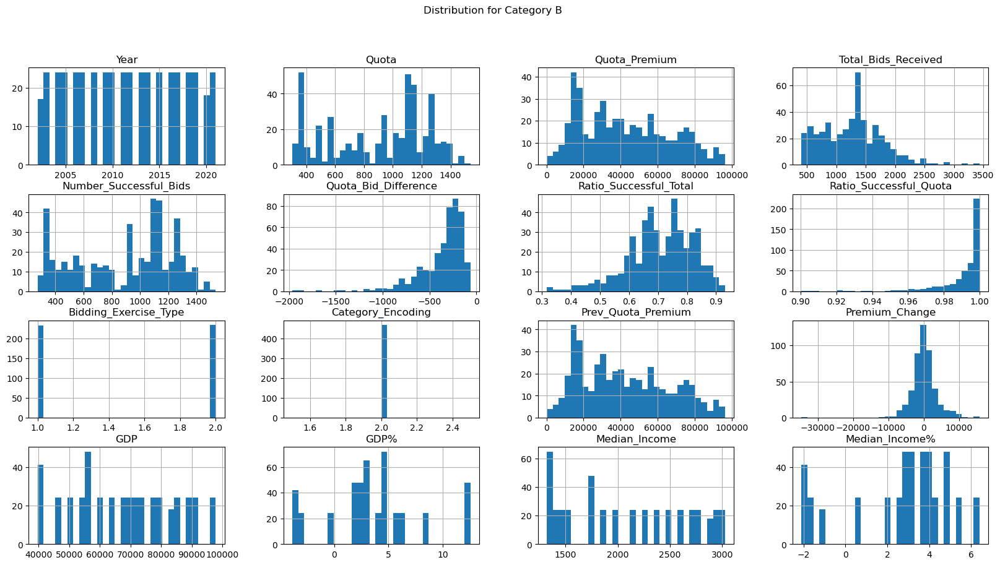

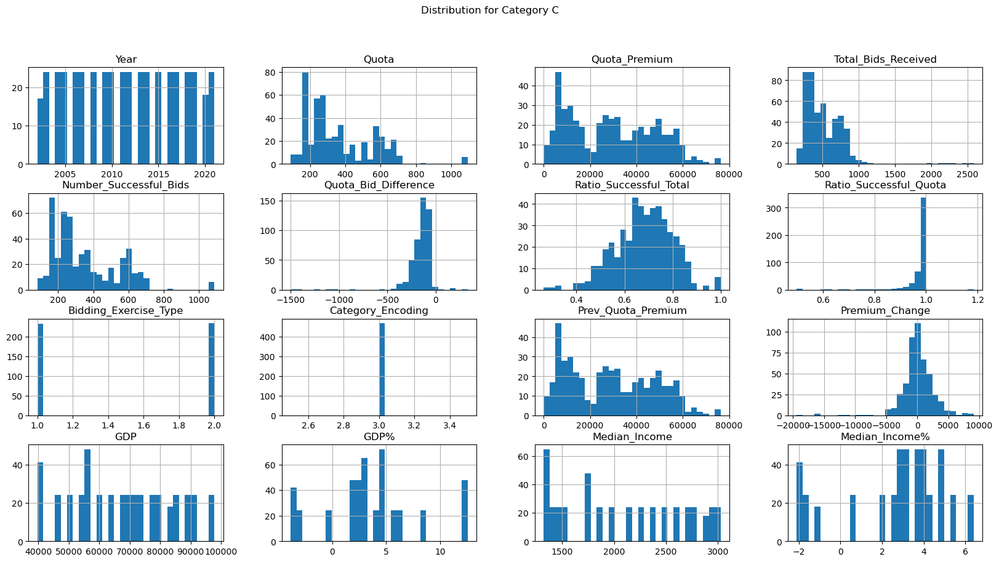

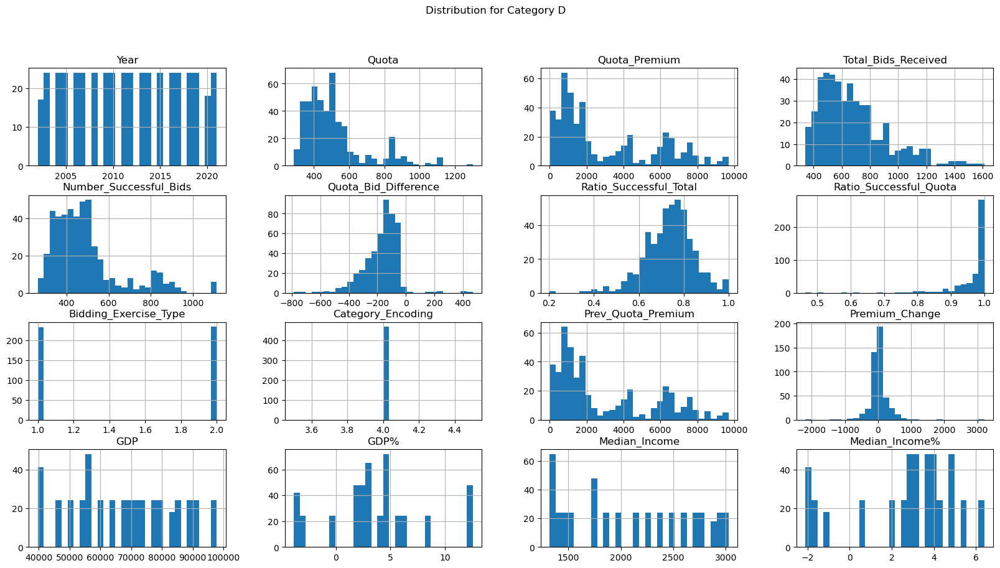

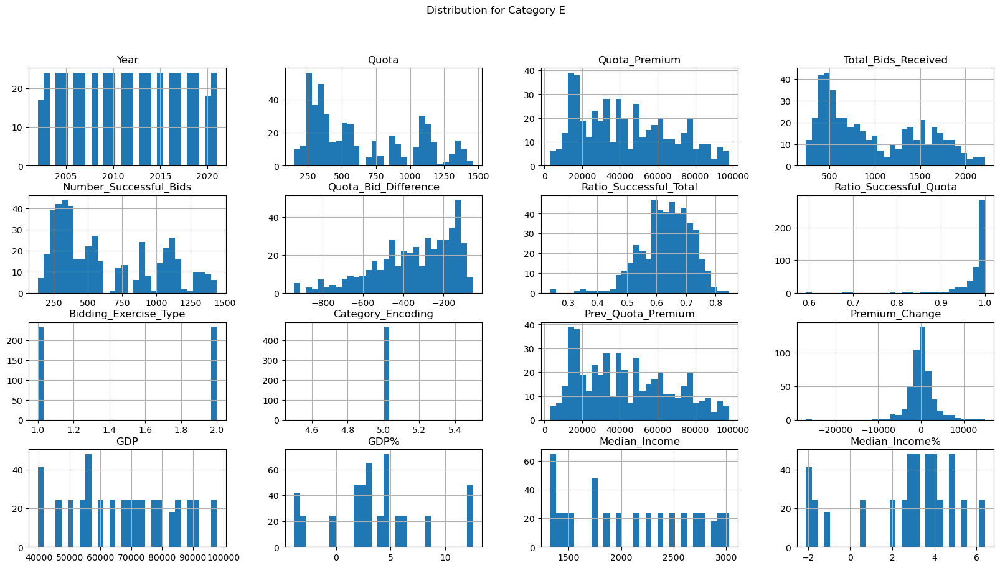

In [11]:
#see distribution of values for all categories
Categories =[*range(1,6)]
for value in Categories:
    Augmented_Table.loc[Augmented_Table.Category_Encoding == value].hist(bins = 30, figsize=(20, 10))
    if value == 1:
        plt.suptitle("Distribution for Category A")
    elif value == 2:
        plt.suptitle("Distribution for Category B")
    elif value == 3:
        plt.suptitle("Distribution for Category C")
    elif value == 4:
        plt.suptitle("Distribution for Category D")
    elif value == 5:
        plt.suptitle("Distribution for Category E")

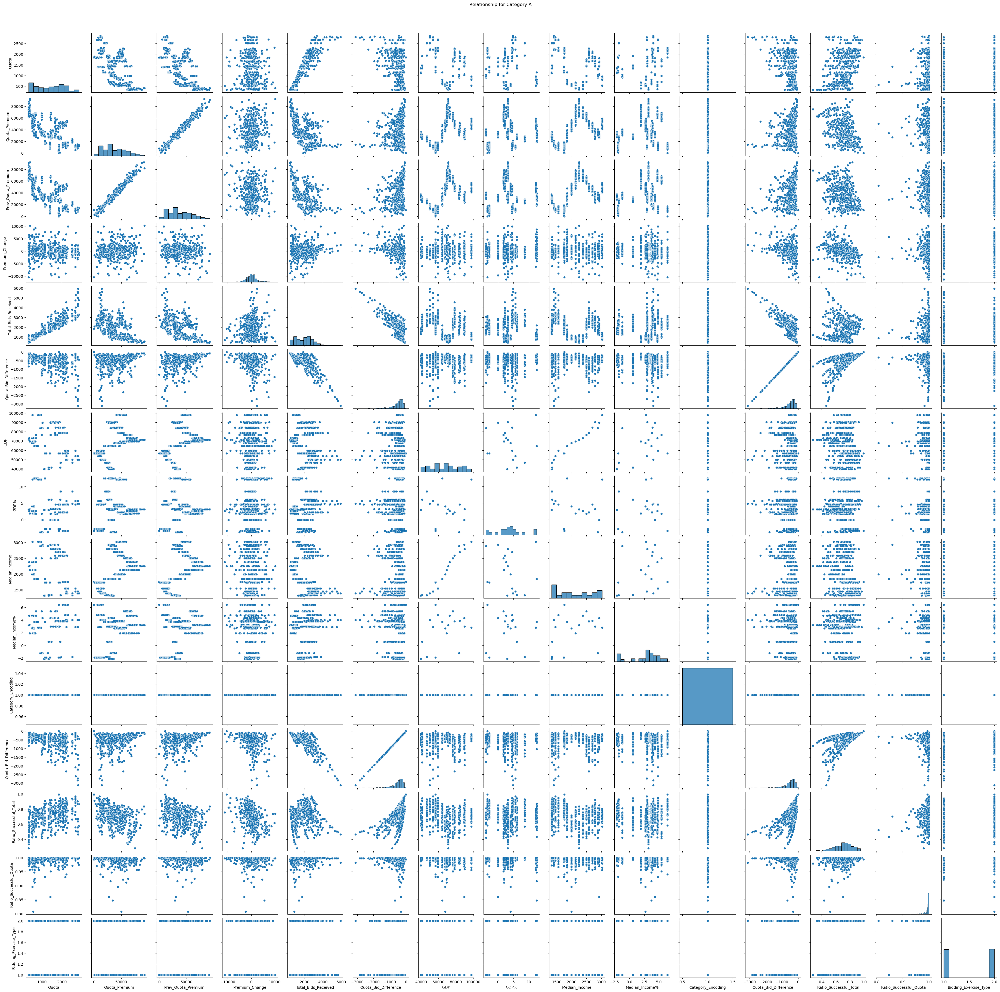

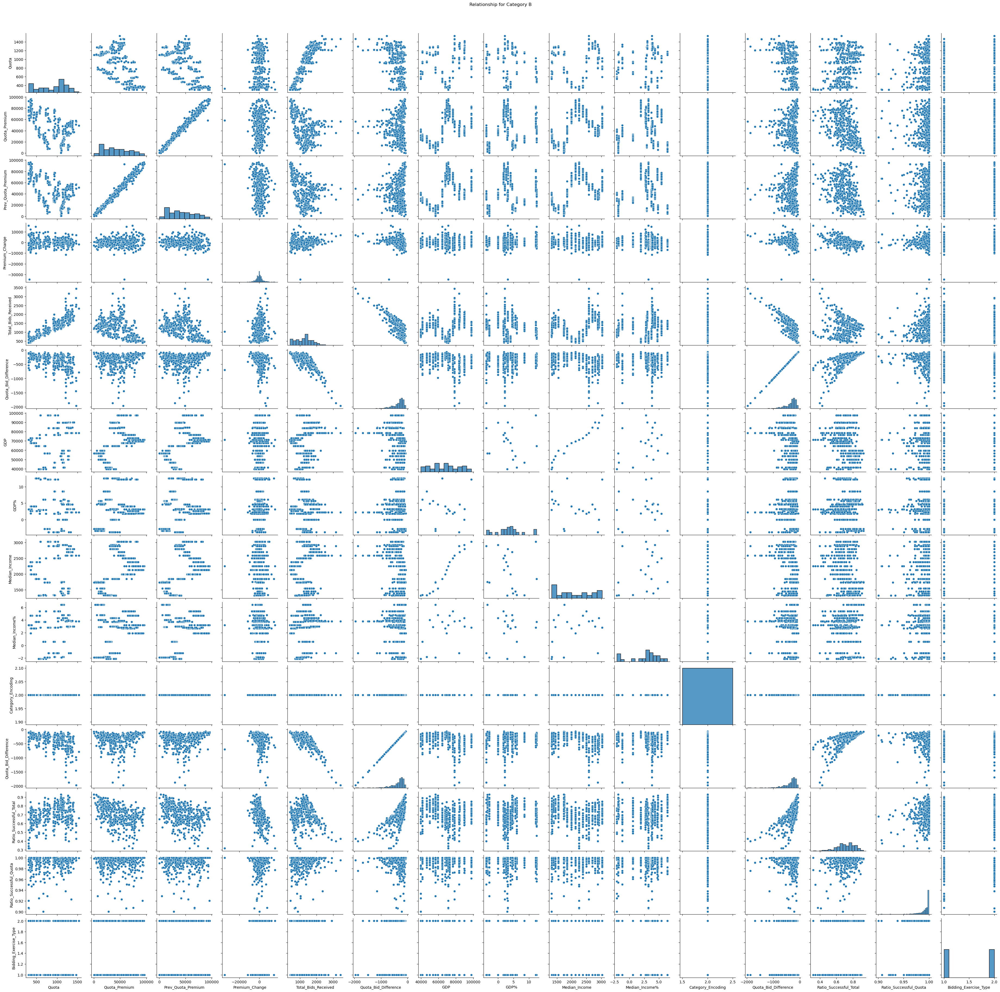

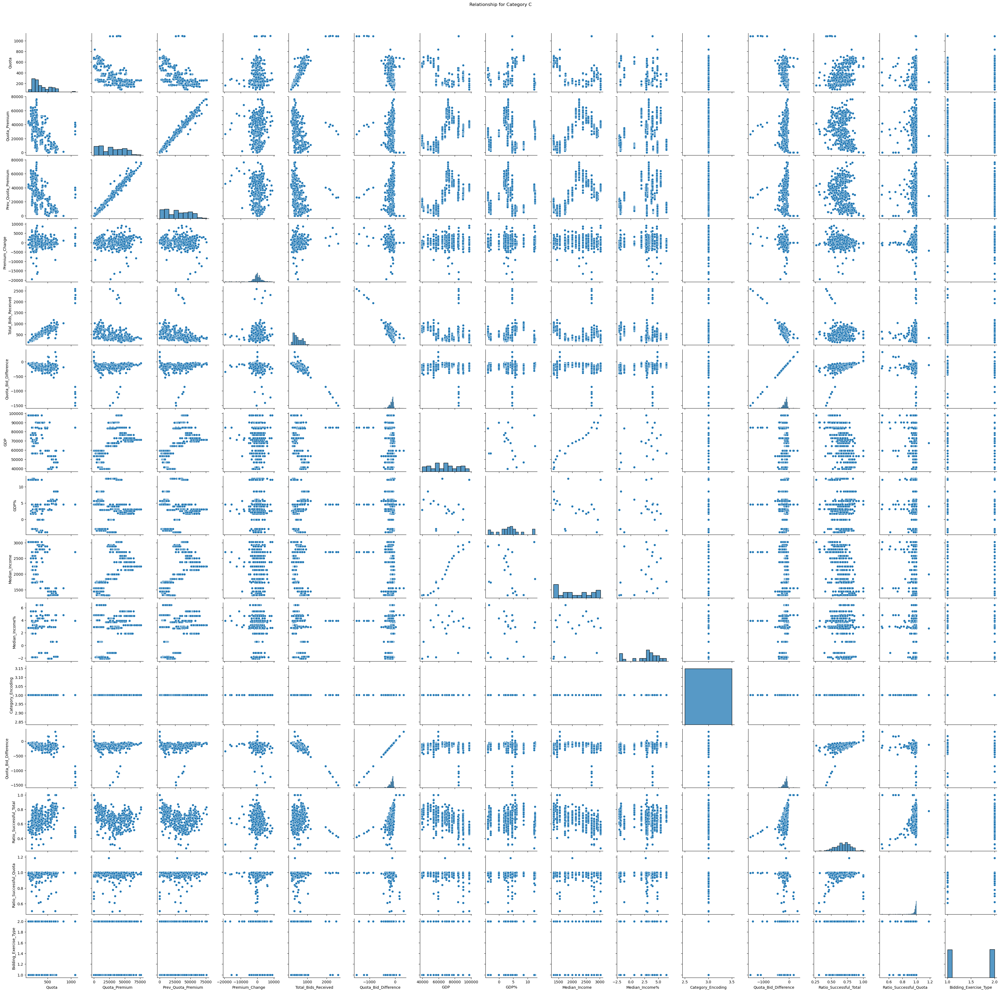

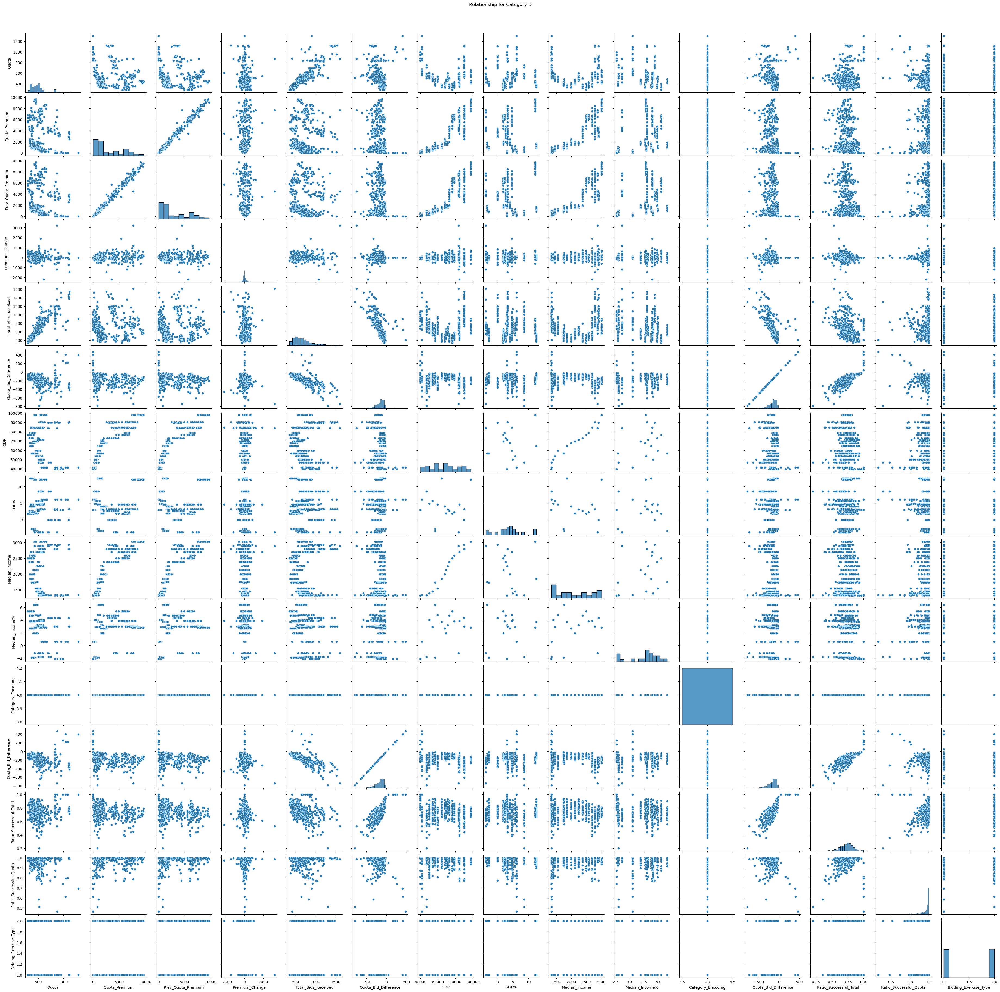

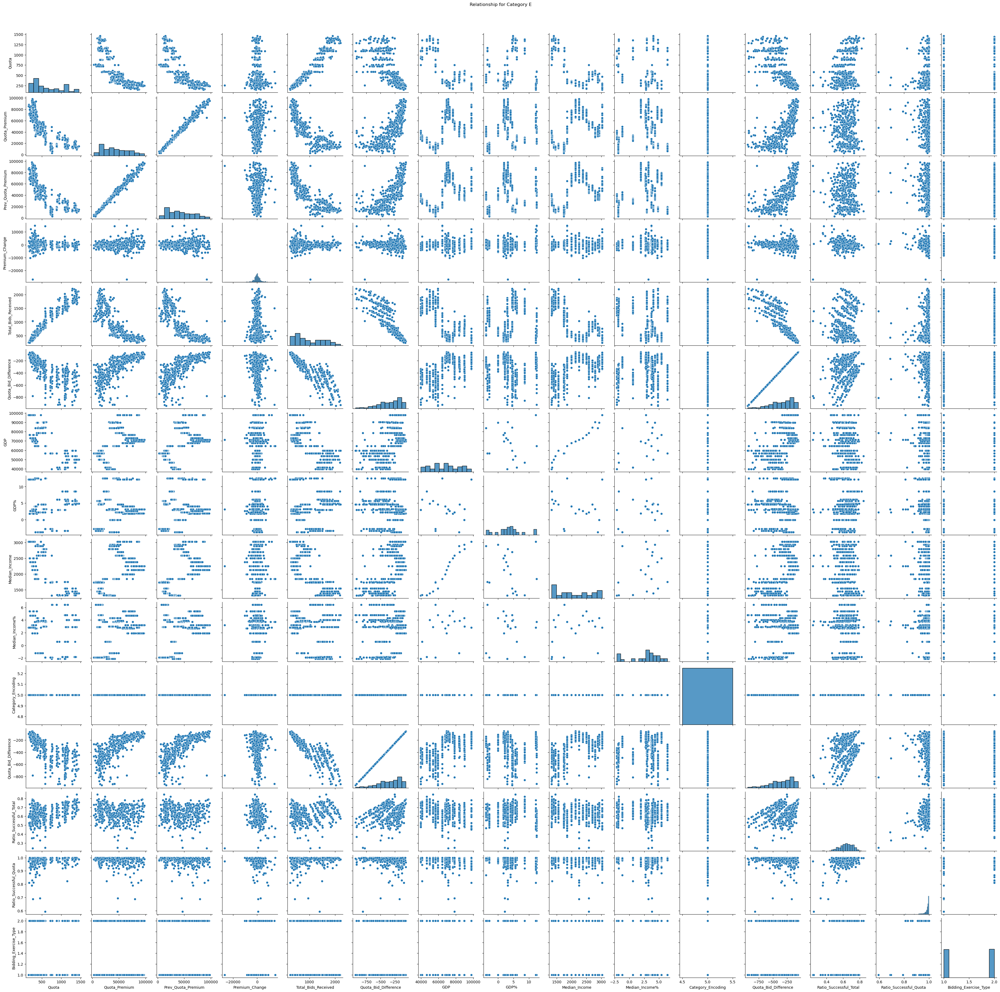

In [12]:
# Check out the variable relations

cols = ['Quota',
        'Quota_Premium',
        'Prev_Quota_Premium',
        'Premium_Change',
        'Total_Bids_Received',
        'Quota_Bid_Difference', 
        'GDP',
        'GDP%',
        'Median_Income',
        'Median_Income%',
        'Category_Encoding',
        'Quota_Bid_Difference',
        'Ratio_Successful_Total',
        'Ratio_Successful_Quota',
        'Bidding_Exercise_Type']


for value in Categories:
    plot = sns.pairplot(Augmented_Table.loc[Augmented_Table.Category_Encoding == value], x_vars=cols, y_vars=cols);
    plot.fig.subplots_adjust(top=0.95)
    if value == 1:
        plot.fig.suptitle("Relationship for Category A")
    elif value == 2:
        plot.fig.suptitle("Relationship for Category B")
    elif value == 3:
        plot.fig.suptitle("Relationship for Category C")
    elif value == 4:
        plot.fig.suptitle("Relationship for Category D")
    elif value == 5:
        plot.fig.suptitle("Relationship for Category E")


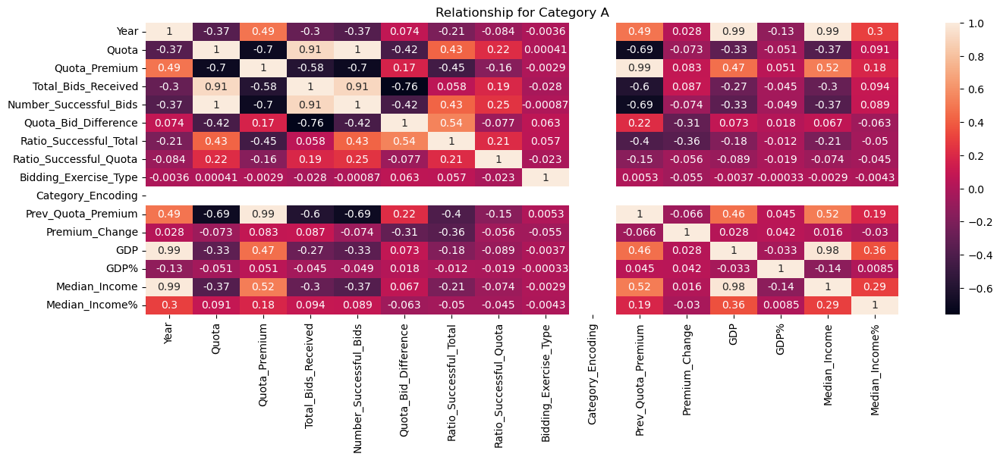

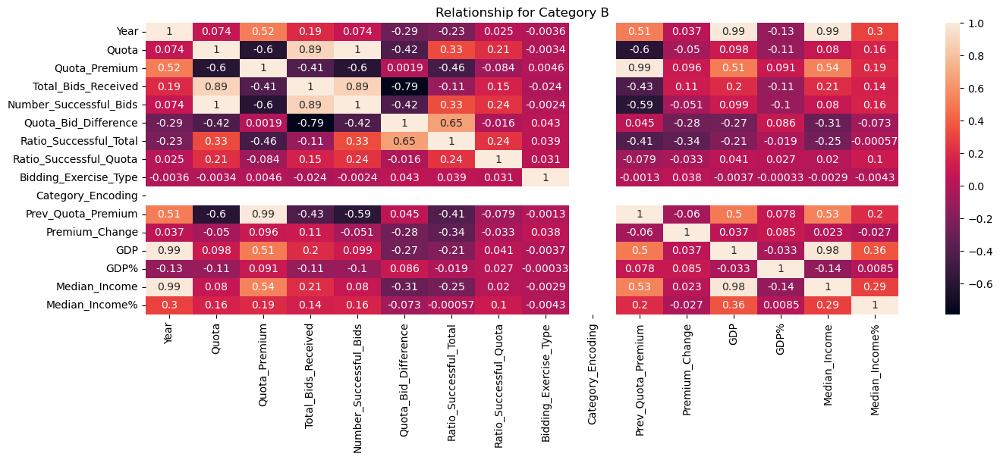

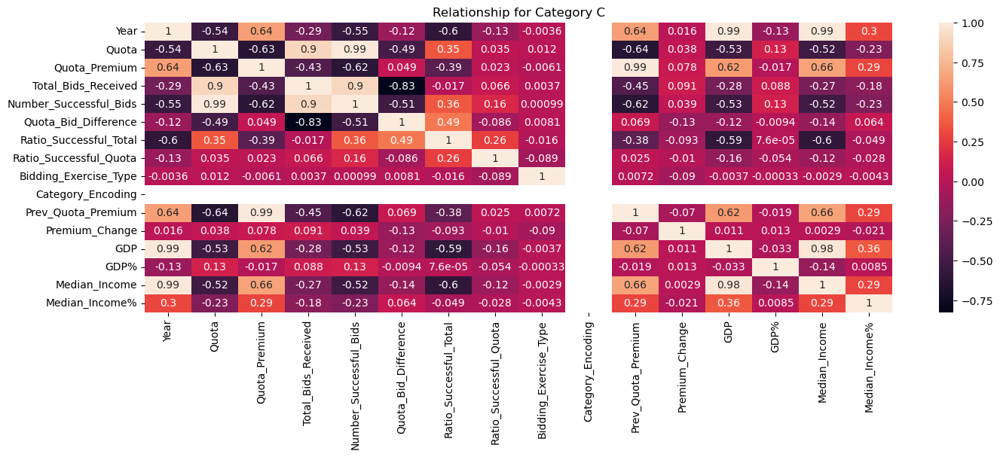

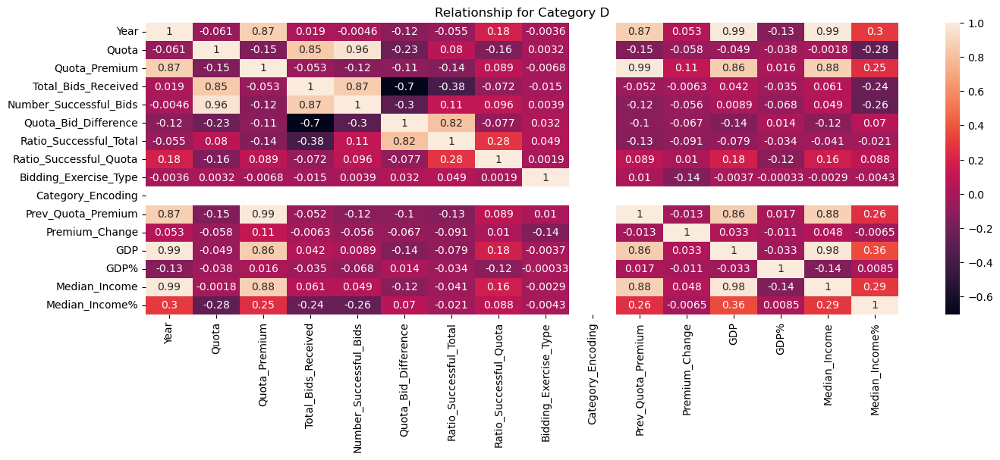

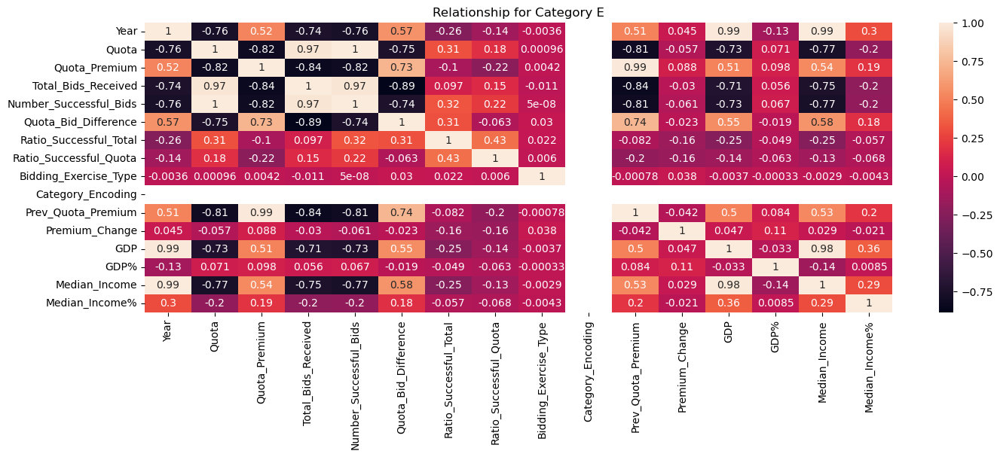

In [13]:
# Check out the variable relations

for value in Categories:
    plt.figure(figsize=(16,5))
    sns.heatmap(Augmented_Table.loc[Augmented_Table.Category_Encoding == value].corr(), annot = True)
    if value == 1:
        plt.title("Relationship for Category A")
    elif value == 2:
        plt.title("Relationship for Category B")
    elif value == 3:
        plt.title("Relationship for Category C")
    elif value == 4:
        plt.title("Relationship for Category D")
    elif value == 5:
        plt.title("Relationship for Category E")

## Analysis of the relationship

The following significant points were noted:

1) Quota premium is most strongly positively correlated with the previous quota premium across all categories (0.99).  The higher the quota premium, the higher the previous quota premium.

2) Quota premium is negatively correlated to quota - the greater the quota the lower the premium.  However, the correlation is not so strong for Category D (motorcycles) (-0.15) compared to the other categories (-0.6 to -0.82).

3) Quota premium is not uniformly correlated with the other features across all the categories.  For instance, its correlation with GDP ranges from -0.47 for Cat A to 0.86 for Cat D.  Similarly, its correlation with median household monthly income ranges from 0.52 for Cat A to 0.88 for Cat D. 


## Model Training

In [14]:
#Create the training and testing datasets.  
#Training data will consist of records from 2002 to 2020
#Test data will consist of 2021 records that will be unseen by the model

train_df = Augmented_Table.loc[Augmented_Table.Year < 2021].reset_index(drop=False)
test_df = Augmented_Table.loc[Augmented_Table.Year == 2021].reset_index(drop=False)

#For use if the columns from the augment table are dropped from the analysis
#Dropping these columns might make sense from a predictive angle as we do not have such
#data until after the year is over unless we are willing to use estimates
#test_df = Recombined_Table_COE.loc[Recombined_Table_COE.Year == 2022].reset_index(drop=False)

In [15]:
#check for null values, shape, columns, type
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2215 entries, 0 to 2214
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   Announcement_Date       2215 non-null   datetime64[ns]
 1   Bidding_Exercise        2215 non-null   object        
 2   Year                    2215 non-null   int64         
 3   Category                2215 non-null   object        
 4   Quota                   2215 non-null   int64         
 5   Quota_Premium           2215 non-null   int64         
 6   Total_Bids_Received     2215 non-null   int64         
 7   Number_Successful_Bids  2215 non-null   int64         
 8   Quota_Bid_Difference    2215 non-null   int64         
 9   Ratio_Successful_Total  2215 non-null   float64       
 10  Ratio_Successful_Quota  2215 non-null   float64       
 11  Bidding_Exercise_Type   2215 non-null   int64         
 12  Category_Encoding       2215 non-null   int8    

In [16]:
#check for null values, shape, columns, type
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 120 entries, 0 to 119
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   Announcement_Date       120 non-null    datetime64[ns]
 1   Bidding_Exercise        120 non-null    object        
 2   Year                    120 non-null    int64         
 3   Category                120 non-null    object        
 4   Quota                   120 non-null    int64         
 5   Quota_Premium           120 non-null    int64         
 6   Total_Bids_Received     120 non-null    int64         
 7   Number_Successful_Bids  120 non-null    int64         
 8   Quota_Bid_Difference    120 non-null    int64         
 9   Ratio_Successful_Total  120 non-null    float64       
 10  Ratio_Successful_Quota  120 non-null    float64       
 11  Bidding_Exercise_Type   120 non-null    int64         
 12  Category_Encoding       120 non-null    int8      

In [17]:
feature_cols = ['Quota', 
                'Prev_Quota_Premium',
                #'Premium_Change',
                'Total_Bids_Received',
                'Number_Successful_Bids', 
                'GDP',
                'GDP%',
                'Median_Income',
                'Median_Income%',
                'Category_Encoding',
                'Quota_Bid_Difference',
                'Ratio_Successful_Total',
                'Ratio_Successful_Quota',
                'Bidding_Exercise_Type']

#Removed the 'Premium_Change' as the model uses this to perfectly predict prices; 
#does not make sense to include as it indicates awareness of the next price.

X = train_df[feature_cols]
y = train_df.Quota_Premium

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, train_size = 0.7, random_state=123, stratify = train_df['Category_Encoding'])
    
linreg = LinearRegression()
linreg.fit(X_train, y_train)
    
y_pred = linreg.predict(X_test)

y_null = np.zeros_like(y_test, dtype = float)
y_null.fill(y_train.mean())

null_RMSE = np.sqrt(metrics.mean_squared_error(y_test, y_null))
RMSE_70_30 = np.sqrt(metrics.mean_squared_error(y_test, y_pred))
R2_70_30 = metrics.r2_score(y_test, y_pred)

print('Intercept:', linreg.intercept_)
print(feature_cols,'Co-efficent:', linreg.coef_)
print('null RMSE',null_RMSE)
print('70_30 RMSE:',RMSE_70_30)
print('R2:',R2_70_30)


Intercept: 5979.252630517509
['Quota', 'Prev_Quota_Premium', 'Total_Bids_Received', 'Number_Successful_Bids', 'GDP', 'GDP%', 'Median_Income', 'Median_Income%', 'Category_Encoding', 'Quota_Bid_Difference', 'Ratio_Successful_Total', 'Ratio_Successful_Quota', 'Bidding_Exercise_Type'] Co-efficent: [-4.05656024e+00  9.85498218e-01 -6.60330453e-01  3.34386660e+00
  5.18422348e-02  1.52769661e+00 -1.43543522e+00 -4.66876732e+01
 -1.38414362e+02 -3.39622978e+00 -4.82221688e+02 -5.13600441e+03
  3.28414335e+01]
null RMSE 24416.139074461076
70_30 RMSE: 2668.6323787517795
R2: 0.9880508165765087


## Analysis

Model created using the 70-30 linear regression model has a RMSE of 2668 which is significantly better than the null RMSE of 24416.  It also has a R Square score error of 0.988 suggests that the model is very good in predicting the dependent variable.

In [18]:
#create a dataframe which includes the actual quota premium and the predicted quota premium
#using the 70-30 model on the training dataset.  To be used for visualising the results via a plot.

table = pd.DataFrame(y_test)
table['pred_quota_premium'] = y_pred
table = table.join(train_df[["Announcement_Date", "Category_Encoding"]])
table = table.sort_values(by=["Announcement_Date","Category_Encoding"], ascending=[True,True])
print(table)


      Quota_Premium  pred_quota_premium Announcement_Date  Category_Encoding
17            42101        40339.678250        2002-04-15                  2
51              409          305.198192        2002-04-15                  4
68            42043        41384.821845        2002-04-15                  5
1             35000        36192.792306        2002-05-01                  1
2             33401        34219.307742        2002-05-15                  1
...             ...                 ...               ...                ...
2158          41101        39135.966140        2020-11-18                  2
2159          45012        41525.485401        2020-12-09                  2
2142          40556        40676.125294        2020-12-23                  1
2160          49300        45283.103299        2020-12-23                  2
2178          35201        33272.353506        2020-12-23                  3

[665 rows x 4 columns]


In [19]:
#check the number of each category in the 70-30 dataset

print(len(table.loc[table.Category_Encoding == 1]))
print(len(table.loc[table.Category_Encoding == 2]))
print(len(table.loc[table.Category_Encoding == 3]))
print(len(table.loc[table.Category_Encoding == 4]))
print(len(table.loc[table.Category_Encoding == 5]))

133
133
133
133
133


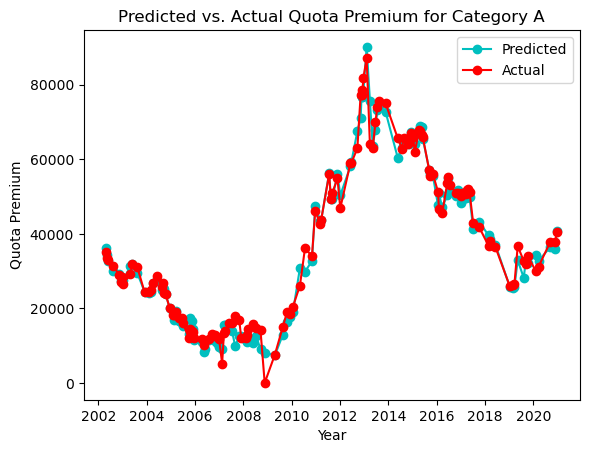

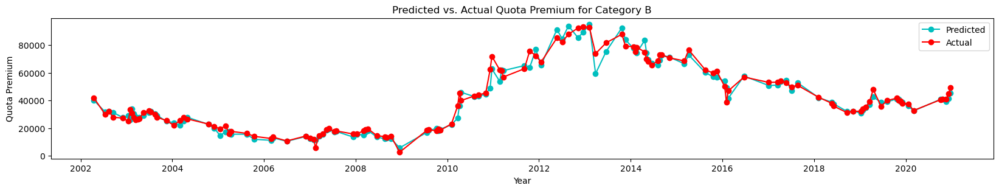

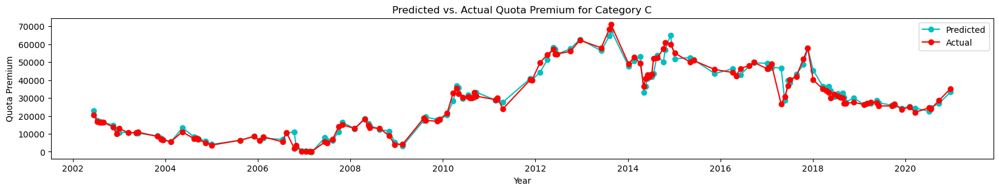

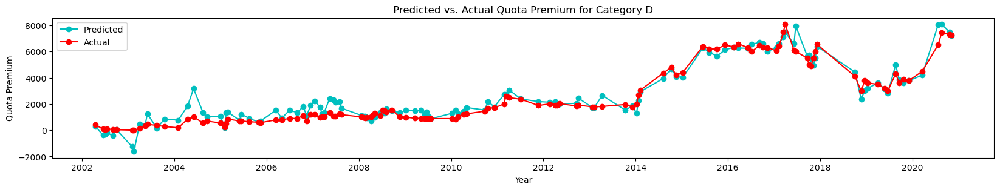

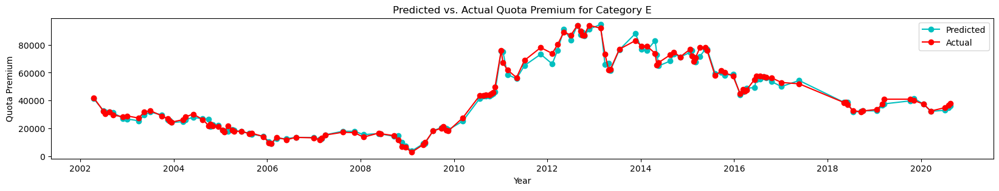

In [20]:
#plot the actual vs. predicted results for each category using the 70-30 model 
#on the training dataset

for value in Categories:
    fig, ax = plt.subplots()
    temp_table = table.copy().loc[table.Category_Encoding == value]
    ax.plot(temp_table.Announcement_Date, temp_table.pred_quota_premium, 'co-', label = 'Predicted')
    ax.plot(temp_table.Announcement_Date, temp_table.Quota_Premium, 'ro-', label = 'Actual')
    ax.set_xlabel("Year")
    ax.set_ylabel("Quota Premium")
    plt.legend()
    plt.rcParams["figure.figsize"] = (20,3)
    if value == 1:
        ax.set_title("Predicted vs. Actual Quota Premium for Category A")
    elif value == 2:
        ax.set_title("Predicted vs. Actual Quota Premium for Category B")
    elif value == 3:
        ax.set_title("Predicted vs. Actual Quota Premium for Category C")
    elif value == 4:
        ax.set_title("Predicted vs. Actual Quota Premium for Category D")
    elif value == 5:
        ax.set_title("Predicted vs. Actual Quota Premium for Category E")


<u>Note:</u> The model has a tendency to predict a higher than actual value for Category D.  The predicted values generally follow the actual values for the other categories.


In [21]:
from sklearn.model_selection import cross_val_score

# Note the results will vary each run since we take a different
# subset of the data each time (since shuffle=True)
kf = model_selection.KFold(n_splits=10, shuffle=True)

print(np.sqrt(np.mean(-cross_val_score(linreg, X, y, cv=kf, scoring='neg_mean_squared_error')))) #out of sample RMSE
print(np.mean(cross_val_score(linreg, X, y, cv=kf))) #out of sample r2

2722.6781125635334
0.9874895943643456


| RMSE from 70-30 | RMSE from CV | R2 from 70-30 | R2 from CV |
|:---------------:|:------------:|:-------------:|:----------:|
|       2668      |     2716     |     0.988     |    0.988   |

Comparison of RMSE and R2 scores between 70-30 and 10-fold CV

In [22]:
#create a dataframe which includes the actual quota premium and the predicted quota premium
#using the 70-30 model on the test unseen dataset.  To be used for visualising the results via a plot.

A = test_df[feature_cols]
b = test_df.Quota_Premium

y_pred_test = linreg.predict(A)

table_test = pd.DataFrame(b)
table_test['pred_quota_premium'] = y_pred_test
table_test = table_test.join(test_df[["Announcement_Date", "Category_Encoding"]])
table_test = table_test.sort_values(by=["Announcement_Date","Category_Encoding"], ascending=[True,True])
#print(table_test.to_string())

In [23]:
RMSE_unseen = np.sqrt(metrics.mean_squared_error(table_test['Quota_Premium'], table_test['pred_quota_premium']))
R2_unseen = metrics.r2_score(table_test['Quota_Premium'], table_test['pred_quota_premium'])

print('RMSE_unseen:',RMSE_unseen)
print('R2_unseen:',R2_unseen)

RMSE_unseen: 3033.231037356002
R2_unseen: 0.9800778068707183


<u>Note:</u> The RMSE of the model when applied to unseen data is slightly higher than when it was applied to the training data (+365).  The R2 error score is also slightly lower (-0.008).

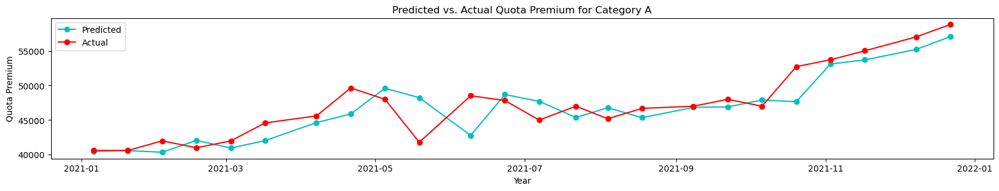

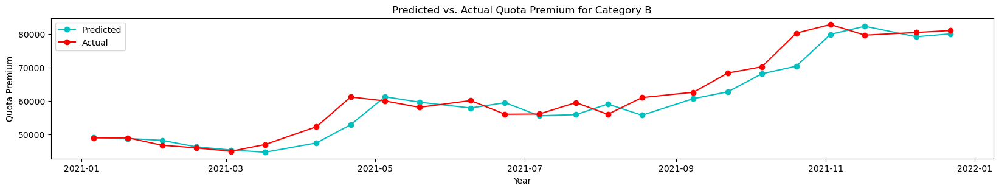

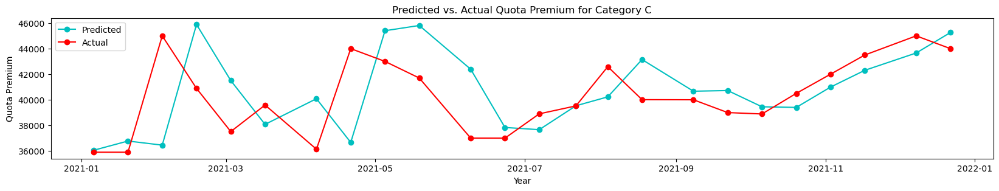

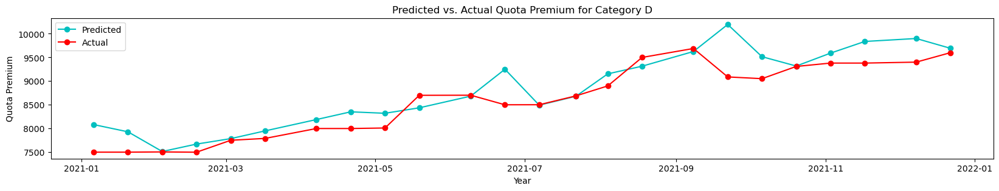

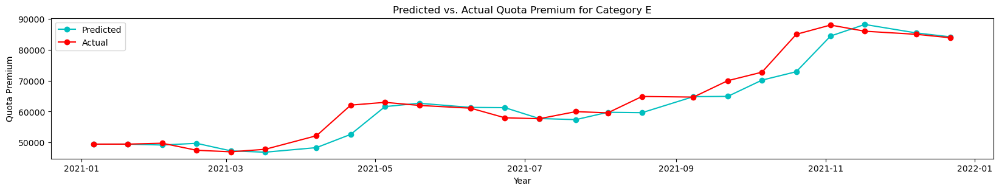

In [24]:
#plot the actual vs. predicted results for each category using the 70-30 model 
#on the test unseen dataset

for value in Categories:
    fig, ax = plt.subplots()
    temp_table_test = table_test.copy().loc[table_test.Category_Encoding == value]
    ax.plot(temp_table_test.Announcement_Date, temp_table_test.pred_quota_premium, 'co-', label = 'Predicted')
    ax.plot(temp_table_test.Announcement_Date, temp_table_test.Quota_Premium, 'ro-', label = 'Actual')
    ax.set_xlabel("Year")
    ax.set_ylabel("Quota Premium")
    plt.legend()
    plt.rcParams["figure.figsize"] = (20,3)
    
    if value == 1:
        ax.set_title("Predicted vs. Actual Quota Premium for Category A")
    elif value == 2:
        ax.set_title("Predicted vs. Actual Quota Premium for Category B")
    elif value == 3:
        ax.set_title("Predicted vs. Actual Quota Premium for Category C")
    elif value == 4:
        ax.set_title("Predicted vs. Actual Quota Premium for Category D")
    elif value == 5:
        ax.set_title("Predicted vs. Actual Quota Premium for Category E")

<u>Note:</u> The model has a tendency to predict a higher than actual value for Category C and D. The predicted values generally follow the actual values for the other categories.

In [25]:
#check for autocorrelation
points_prior = [*range(1,200)]

for n in points_prior:
    print('lag', n, '=',Augmented_Table['Quota_Premium'].autocorr(lag=n))
#turning point at about point 60, full season is about 120

lag 1 = 0.9648750085785488
lag 2 = 0.9302378884962529
lag 3 = 0.8982984008463731
lag 4 = 0.8674291397017818
lag 5 = 0.8396944532860992
lag 6 = 0.8136202695551545
lag 7 = 0.7877081227088705
lag 8 = 0.7625492056884319
lag 9 = 0.7373729743352284
lag 10 = 0.7106691340350492
lag 11 = 0.6839550497119834
lag 12 = 0.6592278568065613
lag 13 = 0.6353034820374849
lag 14 = 0.6124782451883933
lag 15 = 0.5911988757714901
lag 16 = 0.5690525225259775
lag 17 = 0.5464618297618834
lag 18 = 0.5215893087970239
lag 19 = 0.49719674467850433
lag 20 = 0.47338847317026866
lag 21 = 0.44965177865303435
lag 22 = 0.42736847451731563
lag 23 = 0.40654798075450327
lag 24 = 0.3857985037401962
lag 25 = 0.3777547034445112
lag 26 = 0.36904474022974004
lag 27 = 0.36136797929369335
lag 28 = 0.3547064413320113
lag 29 = 0.347332383717613
lag 30 = 0.3428365407448953
lag 31 = 0.33867365959017054
lag 32 = 0.3348940637592061
lag 33 = 0.331408831171274
lag 34 = 0.3271364577432857
lag 35 = 0.3220928888764395
lag 36 = 0.318558041621

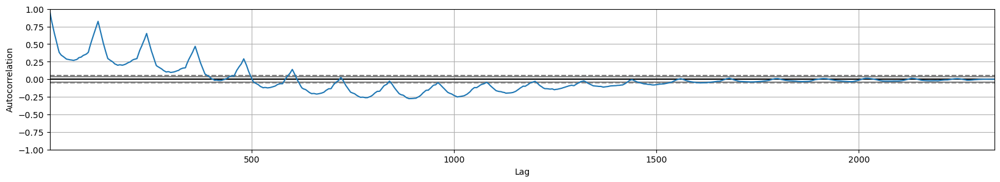

In [26]:
autocorrelation_plot(Augmented_Table.Quota_Premium)
plt.show()

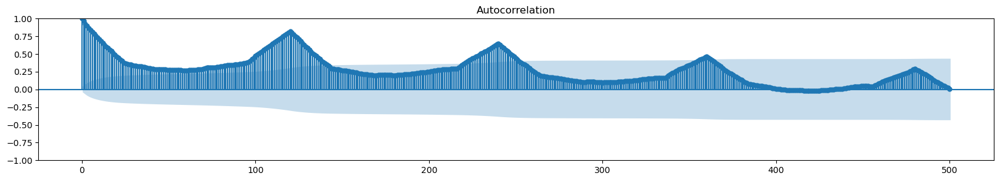

In [27]:
#check for partial auto-correlation
plot_acf(Augmented_Table.Quota_Premium.values, lags = 500)
plt.show()

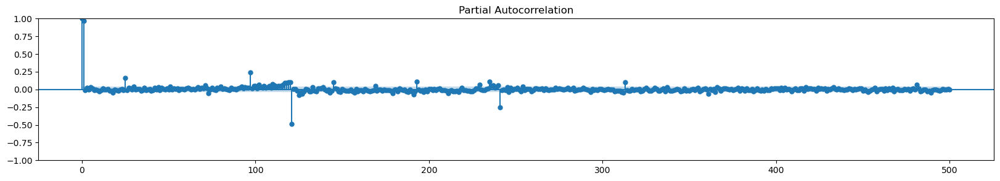

In [28]:
plot_pacf(Augmented_Table.Quota_Premium.values, lags = 500, method='ywm')
plt.show()

In [29]:
#The findings indicate seasonality is present in the time series

In [30]:
#re-sort columns for uniformity when reindexed later for SARIMAX
Augmented_Table_Sarimax = Augmented_Table.sort_values(by = ['Announcement_Date','Category'])
Augmented_Table_Sarimax

,Bidding_Exercise,Year,Category,Quota,Quota_Premium,Total_Bids_Received,Number_Successful_Bids,Quota_Bid_Difference,Ratio_Successful_Total,Ratio_Successful_Quota,Bidding_Exercise_Type,Category_Encoding,Prev_Quota_Premium,Premium_Change,GDP,GDP%,Median_Income,Median_Income%
Announcement_Date,,,,,,,,,,,,,,,,,,
2002-04-15,April 2002 Second Open Bidding Exercise,2002,Cat A (Cars up to 1600cc and 97kW),1149,36000,1890,1148,-741,0.607407,0.999130,2,1,37201.0,-1201.0,39679.13888,2.979230,1320,-2.1
2002-04-15,April 2002 Second Open Bidding Exercise,2002,Cat B (Cars above 1600cc or 97kW),553,42101,1104,553,-551,0.500906,1.000000,2,2,39509.0,2592.0,39679.13888,2.979230,1320,-2.1
2002-04-15,April 2002 Second Open Bidding Exercise,2002,Cat C (Goods vehicles and buses),506,24001,813,490,-307,0.602706,0.968379,2,3,23001.0,1000.0,39679.13888,2.979230,1320,-2.1
2002-04-15,April 2002 Second Open Bidding Exercise,2002,Cat D (Motorcycles),838,409,1084,837,-246,0.772140,0.998807,2,4,540.0,-131.0,39679.13888,2.979230,1320,-2.1
2002-04-15,April 2002 Second Open Bidding Exercise,2002,Cat E (Open),754,42043,1407,753,-653,0.535181,0.998674,2,5,41001.0,1042.0,39679.13888,2.979230,1320,-2.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-22,December 2021 Second Open Bidding Exercise,2021,Cat A (Cars up to 1600cc and 97kW),534,58801,740,534,-206,0.721622,1.000000,2,1,57010.0,1791.0,97798.74306,12.196721,3027,2.8
2021-12-22,December 2021 Second Open Bidding Exercise,2021,Cat B (Cars above 1600cc or 97kW),595,80989,829,590,-234,0.711701,0.991597,2,2,80401.0,588.0,97798.74306,12.196721,3027,2.8
2021-12-22,December 2021 Second Open Bidding Exercise,2021,Cat C (Goods vehicles and buses),90,44000,150,89,-60,0.593333,0.988889,2,3,45000.0,-1000.0,97798.74306,12.196721,3027,2.8


In [31]:
#Split dataset into 80/20 for train/test
train = Augmented_Table_Sarimax.reset_index().iloc[0:1870]
test = Augmented_Table_Sarimax.reset_index().iloc[1870:]

In [32]:
#Dickey-Fuller test
#Define function to easily interpret results.
def interpret_dftest(dftest):
    dfoutput = pd.Series(dftest[0:2], index=['Test Statistic','p-value'])
    return dfoutput

# Execute test on training data.
interpret_dftest(adfuller(train['Quota_Premium']))

Test Statistic   -0.882230
p-value           0.793768
dtype: float64

In [33]:
# Fit and visualize a SARIMAX(1, 0, 0) x (2, 0, 0, 120) model.

sarima = SARIMAX(endog = train['Quota_Premium'].iloc[1:],
                 order = (1, 0, 0),              # (p, d, q)
                 seasonal_order = (2, 0, 0, 120), # (P, D, Q, S)
                 exog = train['Prev_Quota_Premium'].iloc[1:])

#note: couldn't get the syntax for more than one exog variable to work

# Fit SARIMA model.
model = sarima.fit()

# Generate predictions based on test set.
# Start at index 1870 and end at 2333.
preds = model.predict(start=1870, end=2333, exog=test[['Prev_Quota_Premium']])
test['predicted']=preds


# Evaluate predictions.
print("SARIMAX_RSME:", np.sqrt(mean_squared_error(test['Quota_Premium'].iloc[1:], preds)))
print("SARIMAX_R2:", metrics.r2_score(test['Quota_Premium'].iloc[1:], preds))



SARIMAX_RSME: 2543.0911387423025
SARIMAX_R2: 0.978114236932791


| RMSE from 70-30 | RMSE from CV | RMSE from SARIMAX | R2 from CV | R2 from 70-30 | R2 from SARIMAX |
|:---------------:|:------------:|:-----------------:|:----------:|:-------------:|:----------:|
|       2668      |     2716     |       2543        |    0.988   |     0.988     |    0.978   |

Comparison of RMSE and R2 scores between 70-30, 10-fold CV and SARIMAX

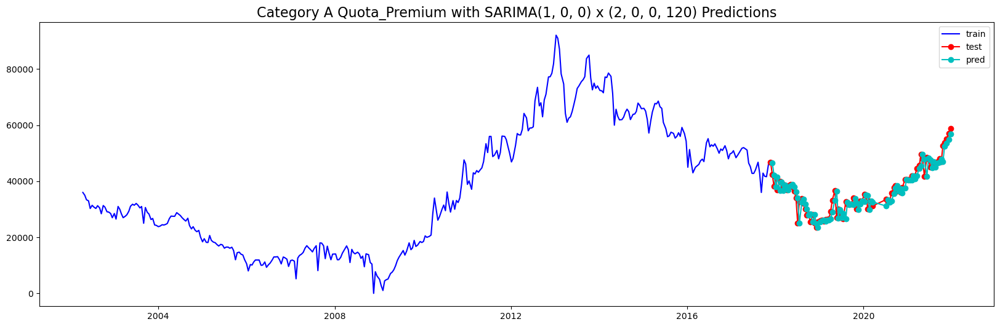

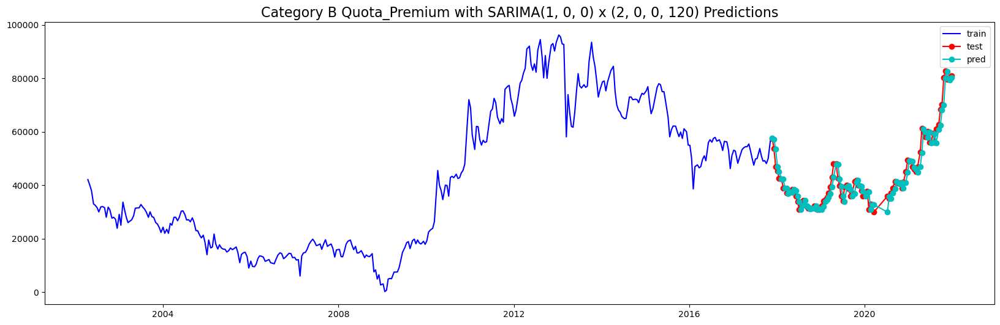

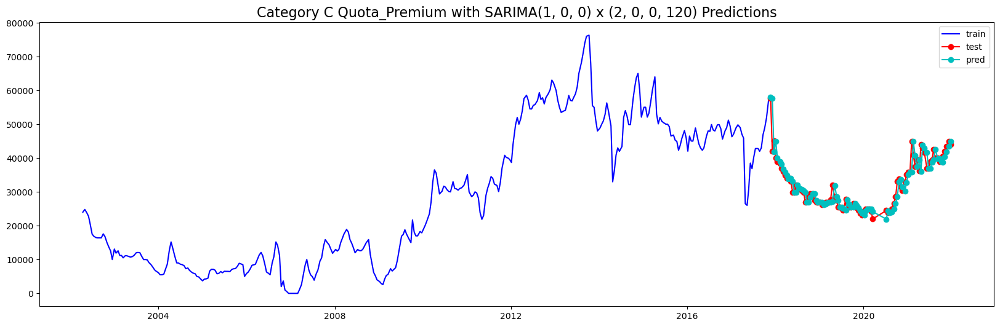

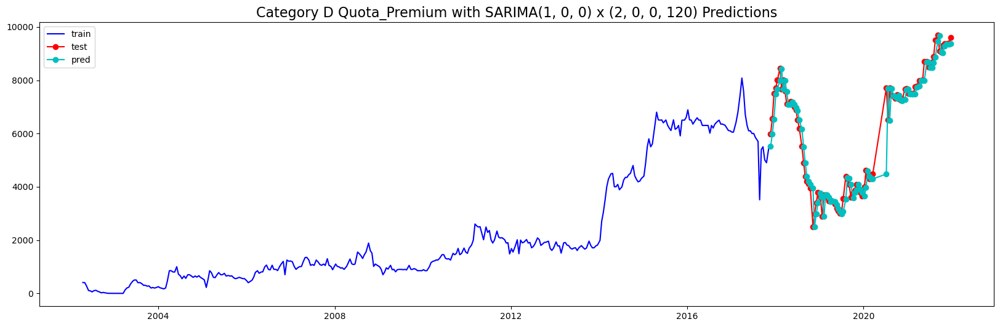

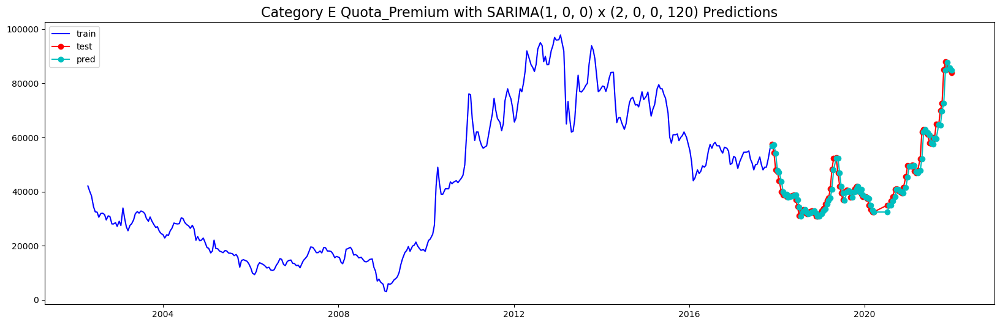

In [34]:
# Set index to date for plot and plot
train.set_index("Announcement_Date", inplace = True)
test.set_index("Announcement_Date", inplace = True)
for value in Categories:
    plt.figure(figsize=(20,6))
    #plt.xlim([,])
    plt.plot(train['Quota_Premium'].loc[train.Category_Encoding == value], color = 'blue', label = 'train')
    plt.plot(test['Quota_Premium'].loc[test.Category_Encoding == value], 'ro-', label = 'test')
    plt.plot(test['predicted'].loc[test.Category_Encoding == value], 'co-', label = 'pred')
    if value == 1:
        plt.title(label = 'Category A Quota_Premium with SARIMA(1, 0, 0) x (2, 0, 0, 120) Predictions', fontsize=16)
    elif value == 2:
        plt.title(label = 'Category B Quota_Premium with SARIMA(1, 0, 0) x (2, 0, 0, 120) Predictions', fontsize=16)
    elif value == 3:
        plt.title(label = 'Category C Quota_Premium with SARIMA(1, 0, 0) x (2, 0, 0, 120) Predictions', fontsize=16)
    elif value == 4:
        plt.title(label = 'Category D Quota_Premium with SARIMA(1, 0, 0) x (2, 0, 0, 120) Predictions', fontsize=16)
    elif value == 5:
        plt.title(label = 'Category E Quota_Premium with SARIMA(1, 0, 0) x (2, 0, 0, 120) Predictions', fontsize=16)
    plt.legend()
    plt.show();

In [49]:
#COE prices of each of the COE categories (A, B, C, D, E) during Dec 2021 Second Bidding Exercise
#(Last entries in dataset used to train the SARIMAX model)
previous_price = {'previous_price': [58801, 80989, 44000, 9601, 83889]}
previous_price = pd.DataFrame(data=previous_price)
previous_price

,previous_price
0,58801
1,80989
2,44000
3,9601
4,83889


In [50]:
#forecast for Jan 2022 First Bidding Exercise
forecast = model.forecast(5, exog=previous_price)
forecast

1870    59909.556923
1871    81118.307918
1872    44001.893288
1873     9603.048585
1874    83700.416591
Name: predicted_mean, dtype: float64

## Comparison of forecast with actual results

|            | Jan 2022 First Bidding Forecasted Price | Jan 2022 First Bidding Actual Price | Difference (%) |
|:----------:|:----------------------------------------:|:------------------------------------:|:--------------:|
| Category A |                  59,910                  |                57,599                |  -2,311 (3.9%) |
| Category B |                  81,118                 |                77,700               |  -3,418 (4.2%)  |
| Category C |                  44,002                  |                42,200                |  -1,802 (4.1%) |
| Category D |                  9,603                  |                9,689                |   86 (0.9%)   |
| Category E |                  83,700                 |                82,501               |   -1,199 (1.4%)   |

RMSE = 2084.02